In [ ]:
import pymc as pm
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
from scipy import special, stats
import numpy as np

In [ ]:
az.style.use('arviz-darkgrid')
plt.rcParams['figure.dpi'] = 300

random_seed = 730612
cores = 4

## Question 3

In [5]:
CHD_df = pd.read_csv("CHDdata.csv")

pd.DataFrame.head(CHD_df)

,sbp,tobacco,ldl,adiposity,famhist,typea,obesity,alcohol,age,chd
0,160,12.00,5.73,23.11,Present,49,25.30,97.20,52,1
1,144,0.01,4.41,28.61,Absent,55,28.87,2.06,63,1
2,118,0.08,3.48,32.28,Present,52,29.14,3.81,46,0
3,170,7.50,6.41,38.03,Present,51,31.99,24.26,58,1
4,134,13.60,3.50,27.78,Present,60,25.99,57.34,49,1


In [ ]:
CHD_df["chd"].value_counts()

chd
0    302
1    160
Name: count, dtype: int64

In [ ]:
df.loc[:, df.columns != 'b']

In [ ]:
CHD_df.loc[:, CHD_df.columns != "famhist"].groupby("chd").agg({"mean", "std", "count"})

sbp                    tobacco                       ldl        \
           mean count        std      mean count       std      mean count   
chd                                                                          
0    135.460265   302  17.984953  2.634735   302  3.612095  4.344238   302   
1    143.737500   160  23.677468  5.524875   160  5.565143  5.487938   160   

               adiposity  ...      typea    obesity                  \
          std       mean  ...        std       mean count       std   
chd                       ...                                         
0    1.870444  23.969106  ...   9.517636  25.737450   302  4.090741   
1    2.225073  28.120250  ...  10.246642  26.622937   160  4.391323   

       alcohol                         age                   
          mean count        std       mean count        std  
chd                                                          
0    15.931358   302  23.499535  38.854305   302  14.882663  
1    19.145250   160  26.181102  50.293750   160  10.649119  

[2 rows x 24 columns]

In [ ]:
import seaborn as sns

<Axes: xlabel='sbp', ylabel='Density'>

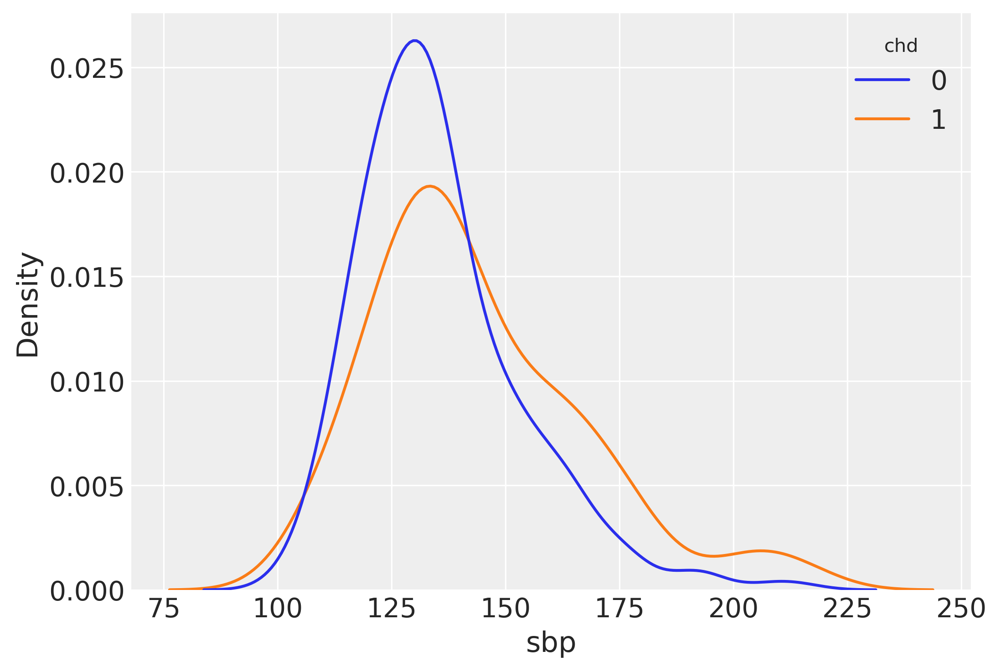

In [ ]:
sns.kdeplot(data=CHD_df, x='sbp', hue='chd', common_norm=False)

<Axes: xlabel='tobacco', ylabel='Density'>

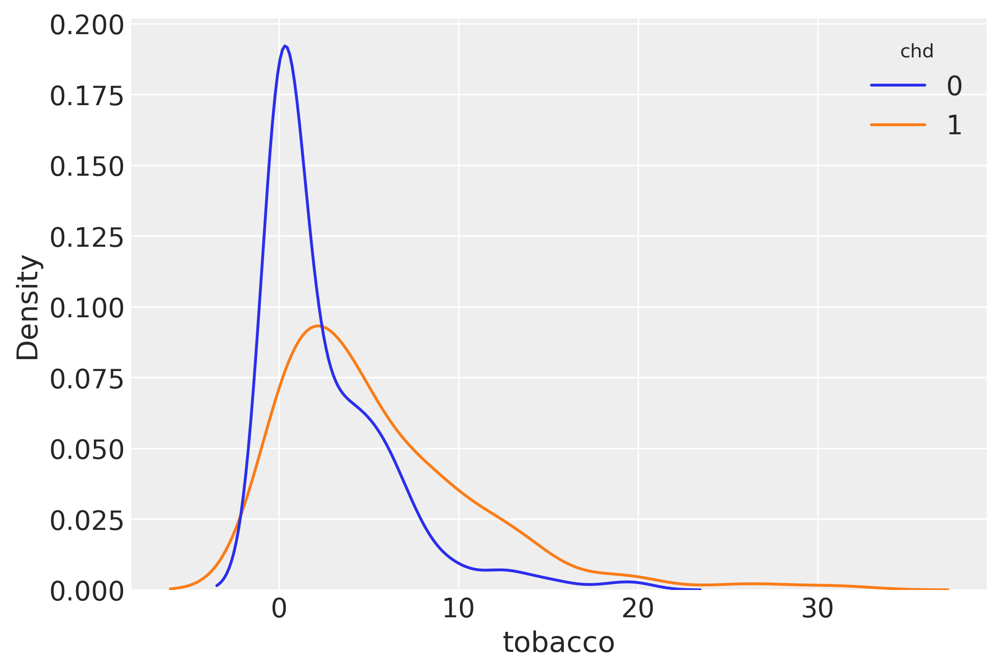

In [ ]:
sns.kdeplot(data=CHD_df, x='tobacco', hue='chd', common_norm=False)

<Axes: xlabel='ldl', ylabel='Density'>

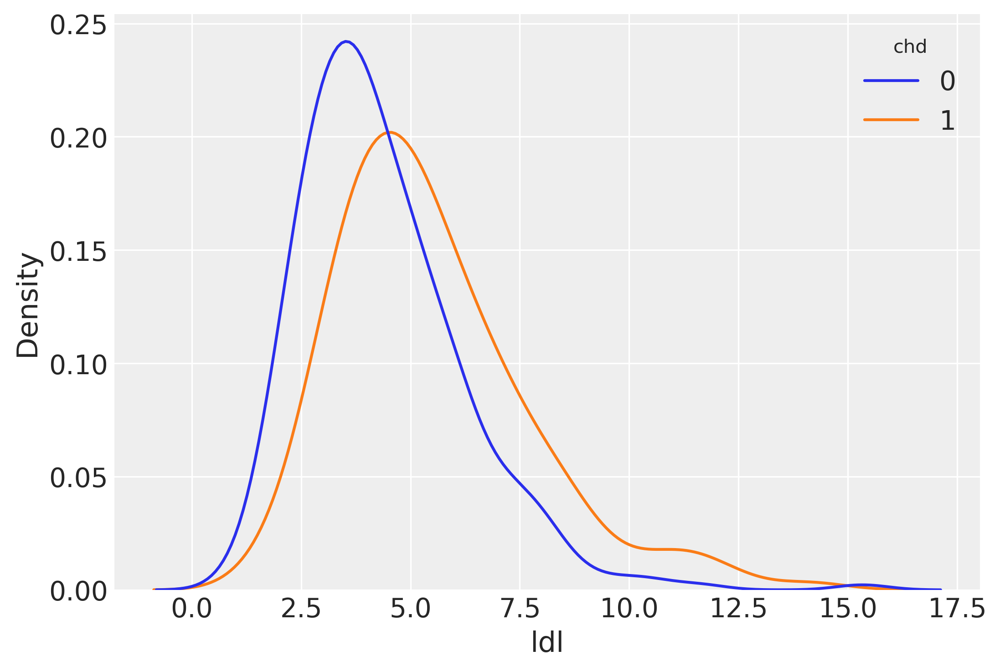

In [ ]:
sns.kdeplot(data=CHD_df, x='ldl', hue='chd', common_norm=False)

<Axes: xlabel='obesity', ylabel='Density'>

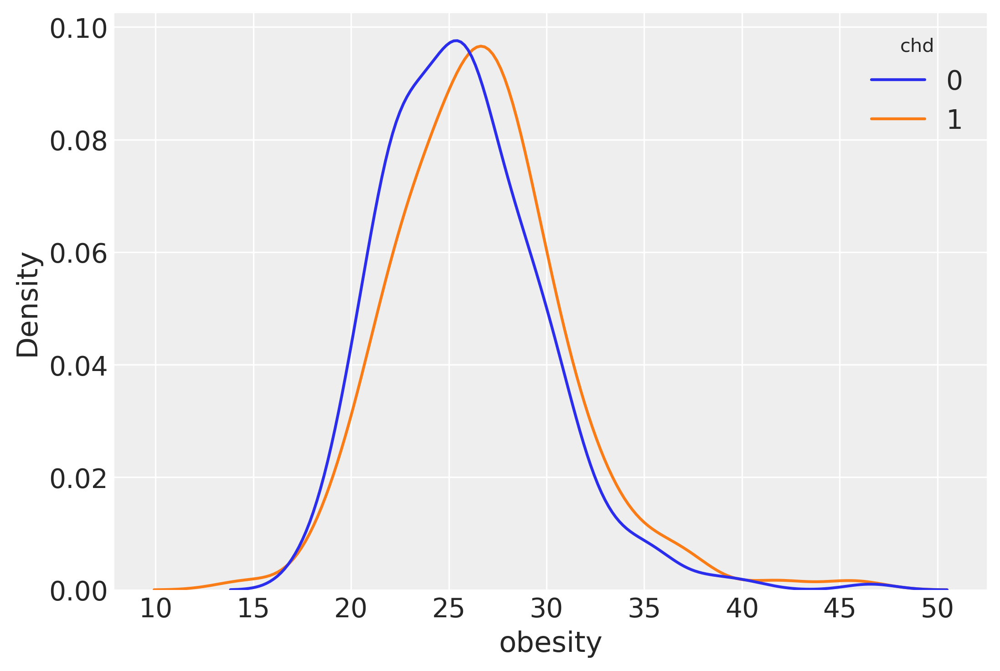

In [ ]:
sns.kdeplot(data=CHD_df, x='obesity', hue='chd', common_norm=False)

<Axes: xlabel='tobacco', ylabel='adiposity'>

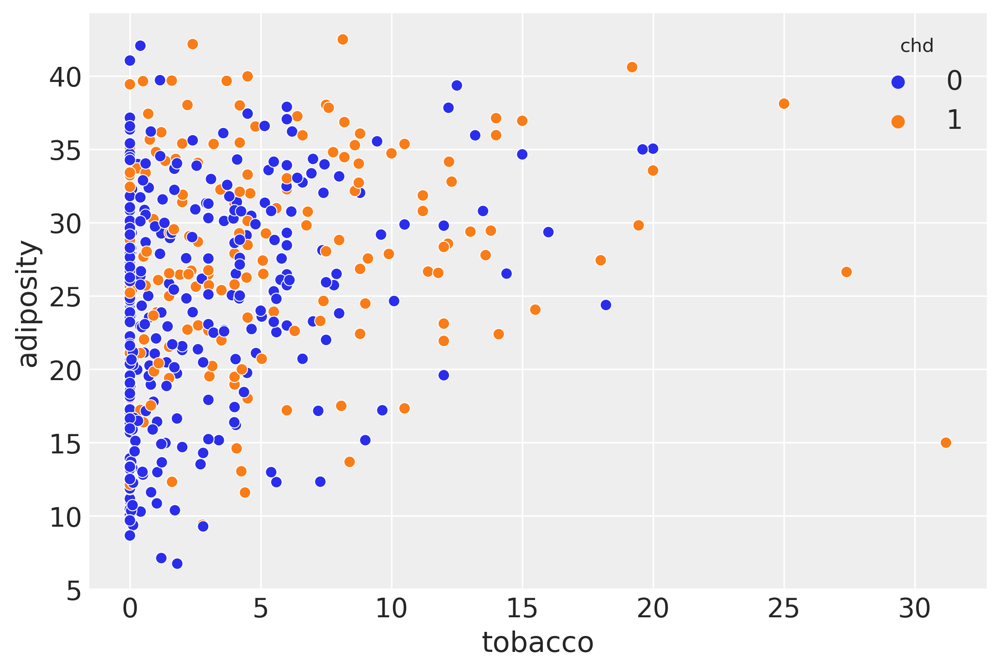

In [ ]:
sns.scatterplot(data=CHD_df, x='tobacco', y='adiposity', hue='chd')

C:\Users\daven\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\daven\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


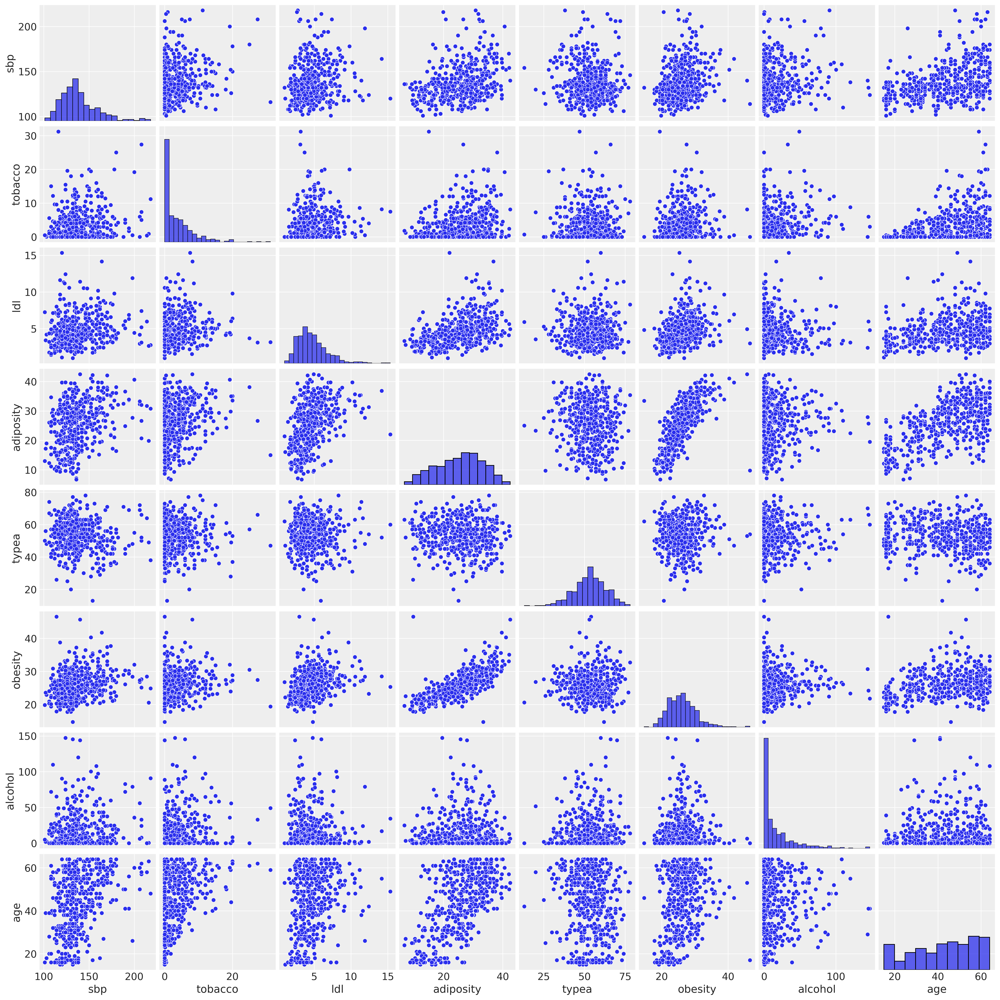

In [ ]:
sns.pairplot(CHD_df[['sbp', 'tobacco', 'ldl', 'adiposity', 'typea', 'obesity', 'alcohol', 'age']])

Obesity and adiposity appear to be highly correlated because adiposity is a measurement of body fat. Alcohol and tobacco datapoints are dense around 0, which makes sense these variables are not binary (yes or no).

In [6]:
#scale numeric predictor variables
X = CHD_df[['sbp', 'tobacco', 'ldl', 'adiposity', 'typea', 'obesity', 'alcohol', 'age']]
meanx = X.mean().values
scalex = X.std().values
zX = ((X-meanx)/scalex).values

In [7]:
#re-code categorical data
replace_map = {"Absent":0, "Present":1}
CHD_df["famhist"] = CHD_df["famhist"].map(replace_map)

I scaled the predictor variables with the Z-transformation so all predictors are on the same scale, and one does not influence chd more just because of large numeric values. If family history was present, I coded it as 1 and if it was absent, I coded it as 0.

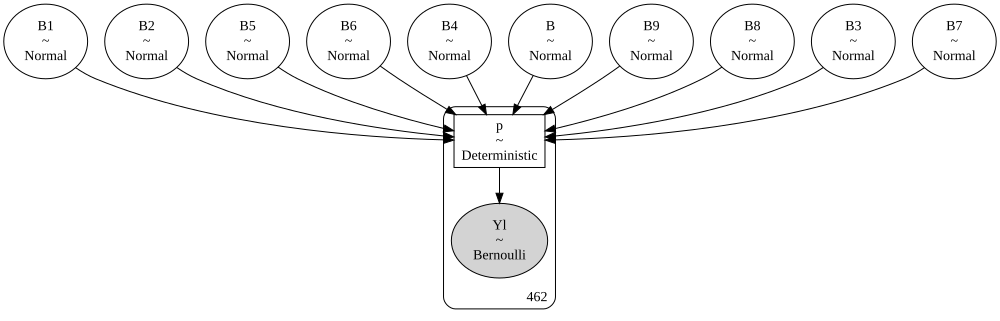

In [9]:
with pm.Model() as glm_model:
    Y = CHD_df["chd"]
    B = pm.Normal('B', mu=0, sigma=10)
    B1 = pm.Normal('B1', mu=0, sigma=10) #sbp
    B2 = pm.Normal('B2', mu=0, sigma=10) #tobacco
    B3 = pm.Normal('B3', mu=0, sigma=10) #ldl
    B4 = pm.Normal('B4', mu=0, sigma=10) #adoposity
    B5 = pm.Normal('B5', mu=0, sigma=10) #typea
    B6 = pm.Normal('B6', mu=0, sigma=10) #obesity
    B7 = pm.Normal('B7', mu=0, sigma=10) #alcohol
    B8 = pm.Normal('B8', mu=0, sigma=10) #age

    B9 = pm.Normal('B9', mu=0, sigma=10) #famhist

    eta = B + B1*zX[:,0]+B2*zX[:,1]+B3*zX[:,2]+B4*zX[:,3]+B5*zX[:,4]+B6*zX[:,5]+B7*zX[:,6]+B8*zX[:,7]+B9*CHD_df["famhist"]
    p = pm.Deterministic('p', pm.invlogit(eta))
    Y1 = pm.Bernoulli('Yl', p=p, observed=Y)

pm.model_to_graphviz(glm_model) #visualization of model

I chose normal distributions for B0, centered on the mean. If all other betas have no affect on chd (0,1), the mean is a good estimate for the model. All other betas are normally distributed with mu=0. This implies that these predictors will have no affect on chd, which is a good null hypothesis.

I chose a bernoulli distribution for the likelihood because each patient either has chd or not.

In [10]:
x = pm.sample_prior_predictive(samples=500, model=glm_model, random_seed=random_seed)

Sampling: [B, B1, B2, B3, B4, B5, B6, B7, B8, B9, Yl]


C:\Users\daven\anaconda3\lib\site-packages\arviz\utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


<Axes: >

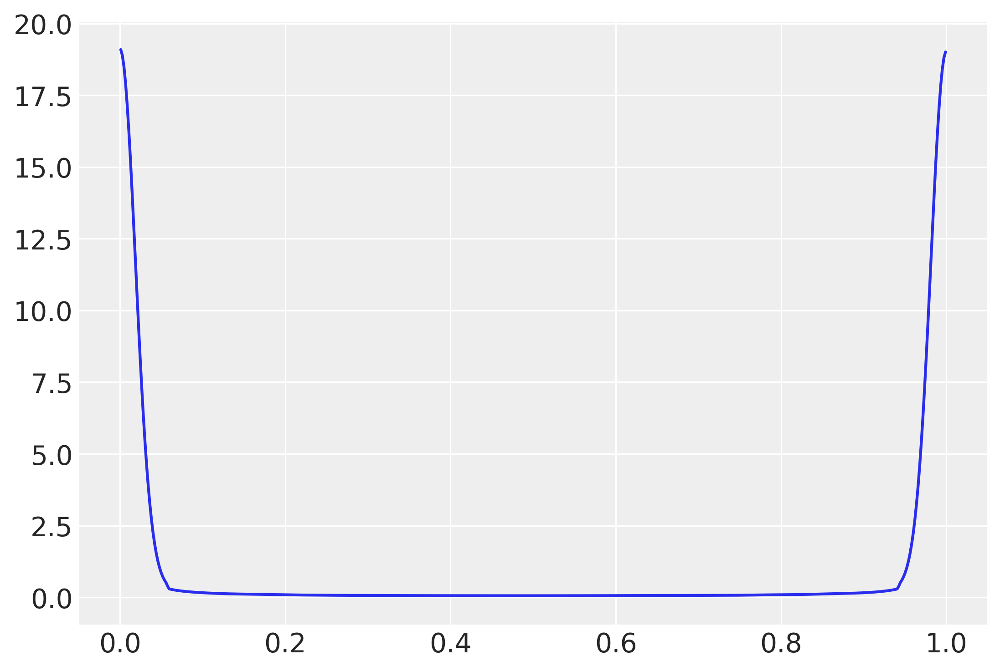

In [11]:
az.plot_dist(x.prior['p'])

The prior predictive plot above suggests that the model is predicting 0 and 1s and nothing inbetween.

In [ ]:
with glm_model:
    CHD_trace = pm.sample(1000, tune=2000, random_seed = random_seed, cores=2, idata_kwargs = {'log_likelihood': True})
simple_trace = pm.to_inference_data(trace=CHD_trace, model=glm_model, log_likelihood=True)

C:\Users\daven\anaconda3\lib\site-packages\pytensor\tensor\rewriting\elemwise.py:1019: UserWarning: Loop fusion failed because the resulting node would exceed the kernel argument limit.
  warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
C:\Users\daven\anaconda3\lib\site-packages\pytensor\tensor\rewriting\elemwise.py:1019: UserWarning: Loop fusion failed because the resulting node would exceed the kernel argument limit.
  warn(
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [B, B1, B2, B3, B4, B5, B6, B7, B8, B9]


Sampling 2 chains for 2_000 tune and 1_000 draw iterations (4_000 + 2_000 draws total) took 1074 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


array([[<Axes: title={'center': 'B'}>, <Axes: title={'center': 'B'}>],
       [<Axes: title={'center': 'B1'}>, <Axes: title={'center': 'B1'}>],
       [<Axes: title={'center': 'B2'}>, <Axes: title={'center': 'B2'}>],
       [<Axes: title={'center': 'B3'}>, <Axes: title={'center': 'B3'}>],
       [<Axes: title={'center': 'B4'}>, <Axes: title={'center': 'B4'}>],
       [<Axes: title={'center': 'B5'}>, <Axes: title={'center': 'B5'}>],
       [<Axes: title={'center': 'B6'}>, <Axes: title={'center': 'B6'}>],
       [<Axes: title={'center': 'B7'}>, <Axes: title={'center': 'B7'}>],
       [<Axes: title={'center': 'B8'}>, <Axes: title={'center': 'B8'}>],
       [<Axes: title={'center': 'B9'}>, <Axes: title={'center': 'B9'}>]],
      dtype=object)

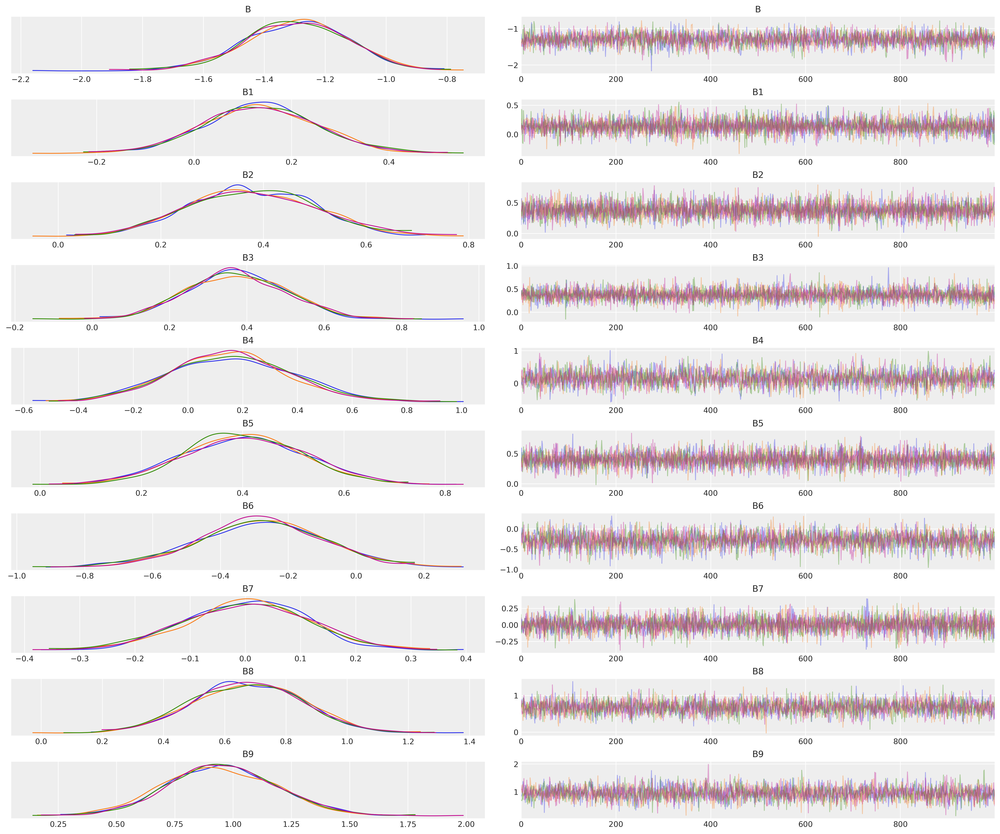

In [ ]:
#trace plots
az.plot_trace(CHD_trace, compact = False, var_names = ['B','B1','B2','B3','B4','B5','B6','B7','B8','B9'], figsize = (18,15))

In [ ]:
#sampling performance
az.summary(CHD_trace, var_names = ['B','B1','B2','B3','B4','B5','B6','B7','B8','B9'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B,-1.294,0.170,-1.618,-0.980,0.003,0.002,3458.0,2784.0,1.0
B1,0.137,0.119,-0.081,0.366,0.002,0.001,5704.0,3156.0,1.0
B2,0.378,0.123,0.153,0.606,0.002,0.001,5399.0,2993.0,1.0
B3,0.374,0.129,0.148,0.614,0.002,0.001,6391.0,3070.0,1.0
B4,0.154,0.224,-0.255,0.590,0.004,0.003,2820.0,2772.0,1.0
B5,0.403,0.119,0.186,0.635,0.002,0.001,6243.0,3156.0,1.0
B6,-0.282,0.185,-0.640,0.064,0.003,0.002,3311.0,3270.0,1.0
B7,0.002,0.112,-0.217,0.202,0.002,0.002,5176.0,2644.0,1.0
B8,0.675,0.177,0.336,0.987,0.003,0.002,3679.0,2900.0,1.0
B9,0.951,0.234,0.530,1.416,0.004,0.003,3368.0,2878.0,1.0


In [ ]:
#posterior predictions
CHD_pp = pm.sample_posterior_predictive(CHD_trace, model = glm_model,random_seed = random_seed)

Sampling: [Yl]


<Axes: title={'center': 'Yl / Yl'}>

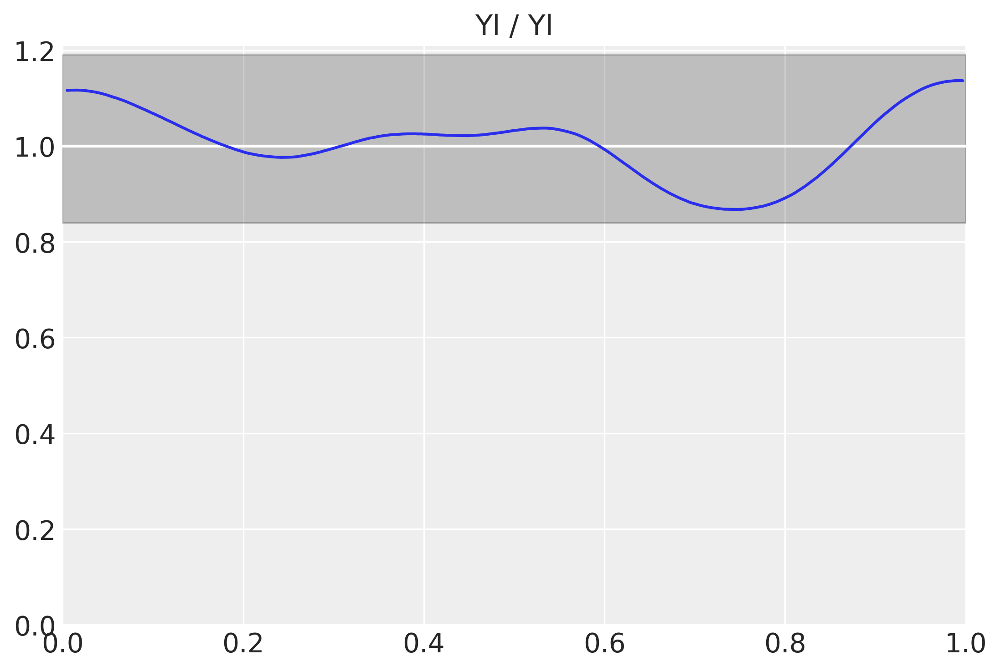

In [ ]:
# Bayesian p value
az.plot_bpv(CHD_pp)

The blue line is a KDE for the proportion of predicted values that are less or equal than the observed computed per observation. The line remains within the darker grey shaded area, indicating well-calibrated predictions.

array([[<Axes: title={'center': 'B'}>, <Axes: title={'center': 'B1'}>,
        <Axes: title={'center': 'B2'}>],
       [<Axes: title={'center': 'B3'}>, <Axes: title={'center': 'B4'}>,
        <Axes: title={'center': 'B5'}>],
       [<Axes: title={'center': 'B6'}>, <Axes: title={'center': 'B7'}>,
        <Axes: title={'center': 'B8'}>],
       [<Axes: title={'center': 'B9'}>, <Axes: >, <Axes: >]], dtype=object)

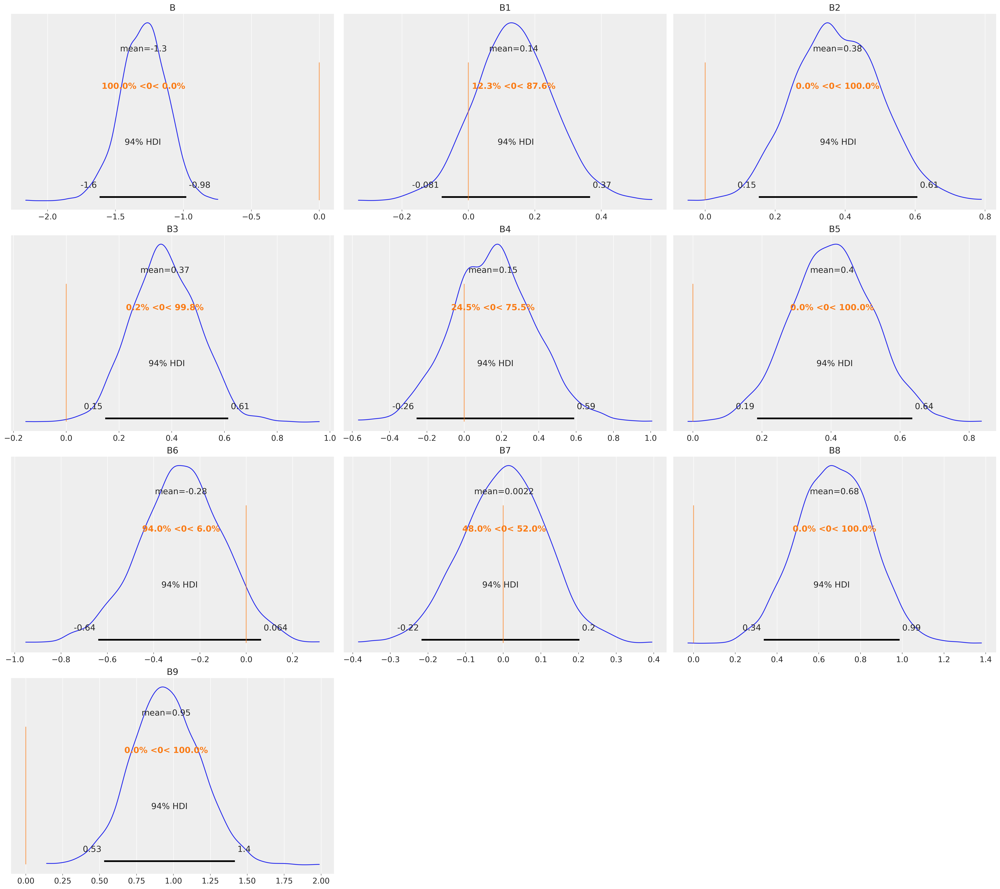

In [ ]:
#plot posterior distributions for params
az.plot_posterior(CHD_trace,var_names=['B','B1','B2','B3','B4','B5','B6','B7','B8','B9'], ref_val = 0,)

B1, B4, B6 and B7 all contain 0 in the HDI. This suggests that these predictor variables do not have an effect on CHD. I would be inclined to remove these predictors.

<Axes: xlabel='Yl / Yl'>

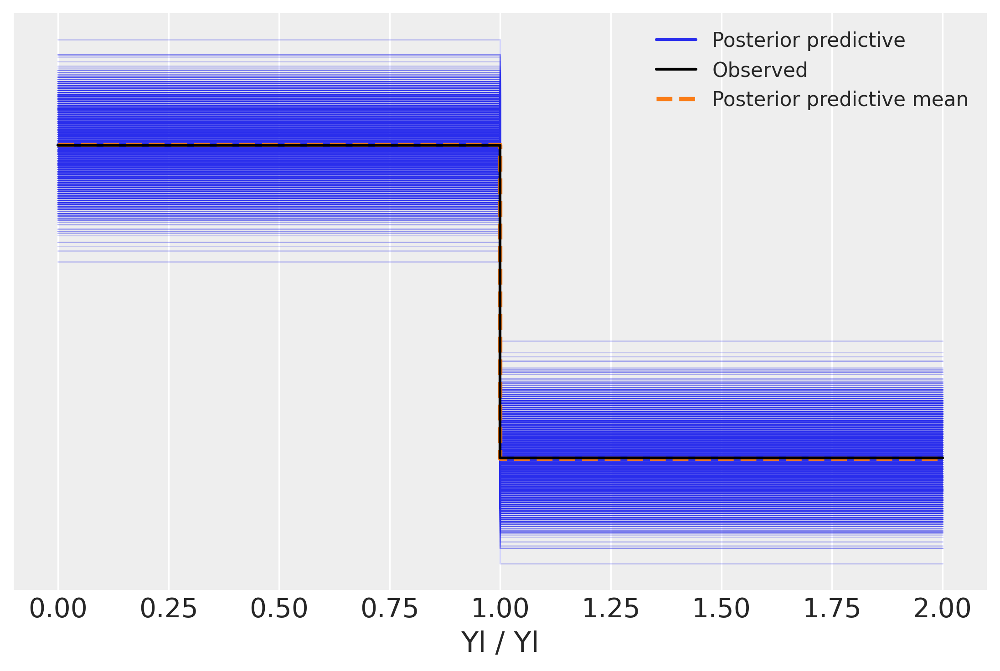

In [ ]:
# Posterior predictions of odds ratios
az.plot_ppc(CHD_pp)

Text(0.5, 1.0, 'LDL Odds Ratio with 95% CI')

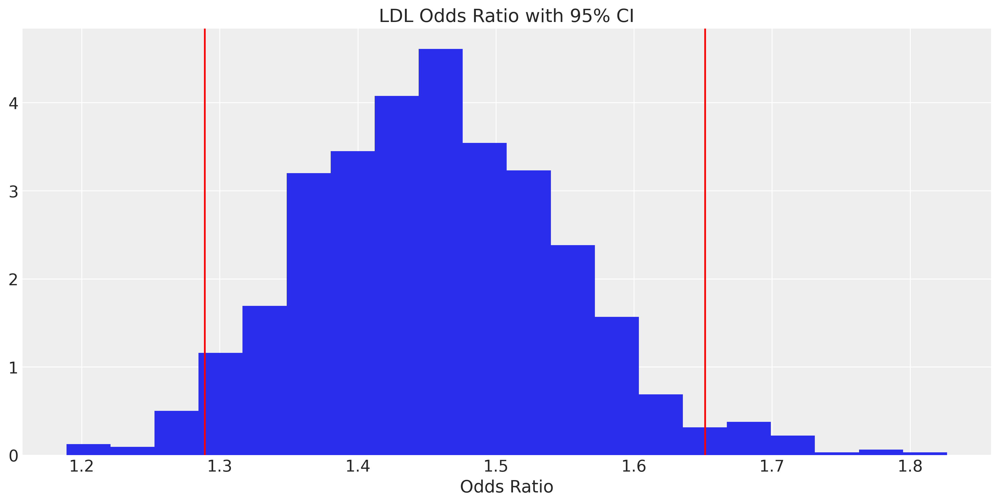

In [ ]:
# 'ldl' Odds Ratio with 95% CI
_, ax = plt.subplots(figsize=(12, 6))
b = CHD_trace.posterior["B3"]
OR = np.mean(b, axis =0)
lb, ub = np.percentile(OR, 2.5), np.percentile(OR, 97.5)
plt.hist(np.exp(OR), bins=20, density=True)
plt.axvline(np.exp(lb), color = 'r')
plt.axvline(np.exp(ub), color = 'r')
plt.xlabel("Odds Ratio")
plt.title("LDL Odds Ratio with 95% CI")

1 unit increase in LDL results in an increase between 1.3 and 1.6 time likelihood to be classified with CHD.

In [ ]:
#transform tobacco with log to reduce varience within tobacco
CHD_df["tobacco_log"] = np.log(CHD_df["tobacco"]+1)

In [ ]:
#re-code categorical data
replace_map = {"Absent":0, "Present":1}
CHD_df["famhist"] = CHD_df["famhist"].map(replace_map)

In [ ]:
#scale numeric predictor variables
X = CHD_df[['sbp', 'tobacco_log', 'ldl', 'adiposity', 'typea', 'obesity', 'alcohol', 'age']]
meanx = X.mean().values
scalex = X.std().values
zX = ((X-meanx)/scalex).values

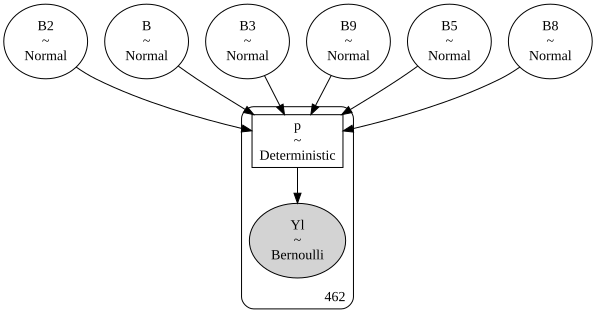

In [ ]:
#Non-linear Model
with pm.Model() as glm_model_new:
    Y = CHD_df["chd"]
    B = pm.Normal('B', mu=0, sigma=10)
    B2 = pm.Normal('B2', mu=0, sigma=10) #tobacco
    B3 = pm.Normal('B3', mu=0, sigma=10) #ldl
    B5 = pm.Normal('B5', mu=0, sigma=10) #typea
    B8 = pm.Normal('B8', mu=0, sigma=10) #age

    B9 = pm.Normal('B9', mu=0, sigma=10) #famhist

    eta = B+B2*zX[:,1]+B3*zX[:,2]+B5*zX[:,4]+B8*zX[:,7]+B9*CHD_df["famhist"]
    p = pm.Deterministic('p', pm.invlogit(eta))
    Yl = pm.Bernoulli('Yl', p=p, observed=Y)

pm.model_to_graphviz(glm_model_new) #visualization of model

In [ ]:
with glm_model_new:
    CHD_trace_new = pm.sample(1000, tune=2000, random_seed = random_seed, cores=2, idata_kwargs = {'log_likelihood': True})
simple_trace_new = pm.to_inference_data(trace=CHD_trace_new, model=glm_model_new, log_likelihood=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [B, B2, B3, B5, B8, B9]


Sampling 2 chains for 2_000 tune and 1_000 draw iterations (4_000 + 2_000 draws total) took 7518 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [ ]:
#posterior predictions
CHD_pp_new = pm.sample_posterior_predictive(CHD_trace_new, model = glm_model_new,random_seed = random_seed)

Sampling: [Yl]


<Axes: title={'center': 'Yl / Yl'}>

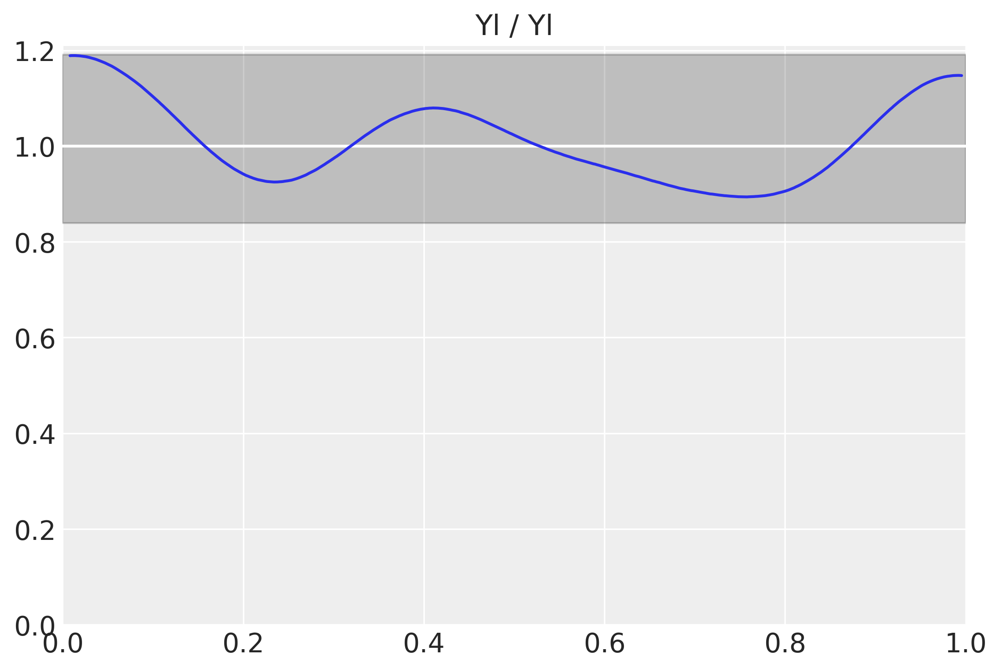

In [ ]:
# Bayesian p value
az.plot_bpv(CHD_pp_new)

<Axes: xlabel='Yl / Yl'>

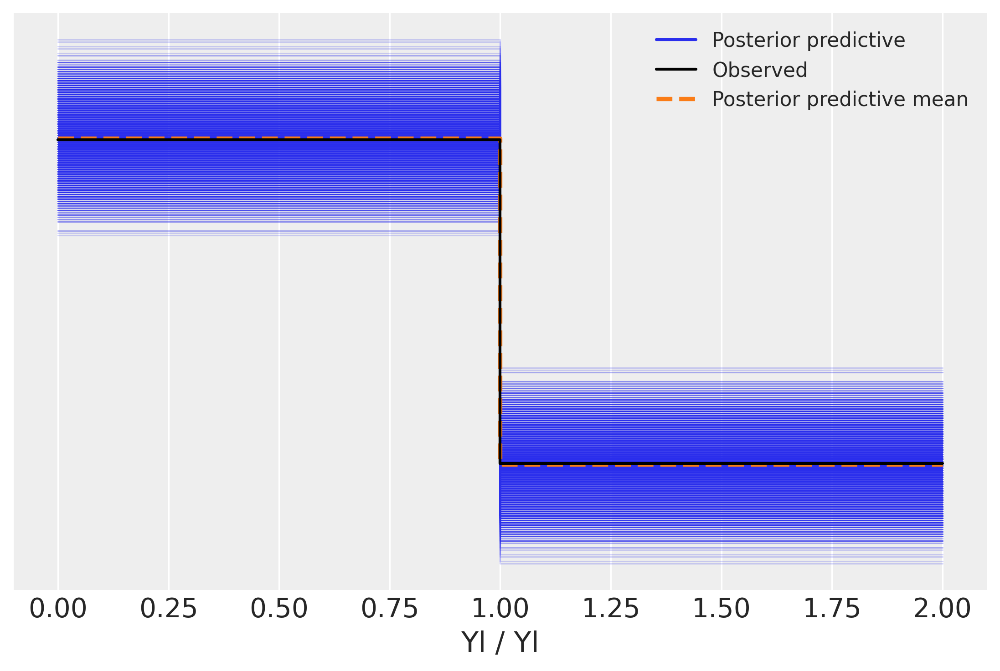

In [ ]:
# Posterior predictions of odds ratios
az.plot_ppc(CHD_pp_new)

array([[<Axes: title={'center': 'B'}>, <Axes: title={'center': 'B2'}>,
        <Axes: title={'center': 'B3'}>],
       [<Axes: title={'center': 'B5'}>, <Axes: title={'center': 'B8'}>,
        <Axes: title={'center': 'B9'}>]], dtype=object)

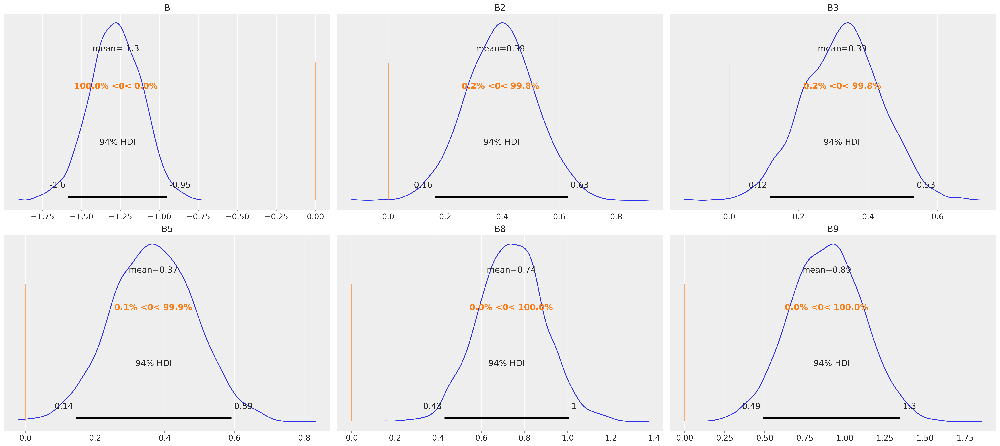

In [ ]:
#plot posterior distributions for params
az.plot_posterior(CHD_trace_new,var_names=['B','B2','B3','B5','B8','B9'], ref_val = 0,)

In [ ]:
# WAIC comparison
cmp_df = az.compare({'model_l':simple_trace, 'model_2':simple_trace_new}, ic='waic')
cmp_df

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
model_2,0,-243.825540,5.886856,0.000000,1.000000e+00,10.907990,0.000000,False,log
model_l,1,-246.885354,10.772374,3.059813,6.217249e-15,11.188655,2.191313,False,log


In [ ]:
# LOO
cmp_df = az.compare({'model_l':simple_trace, 'model_2':simple_trace_new}, ic='loo')
cmp_df

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model_2,0,-243.847921,5.909237,0.000000,1.000000e+00,10.909210,0.000000,False,log
model_l,1,-246.934338,10.821359,3.086417,3.108624e-15,11.190839,2.193081,False,log


Based on the WAIC and LOO estimations, model 2 (non-linear) is favored. Model 2 weight is ALMOST 1. The smaller the WAIC the better fit the model. Model 2's WAIC, or deviance, is over 50% less than model 1's.